In [1]:
import os
from os import listdir
from PIL import Image
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import cv2
import pandas as pd
from skimage import io, color
from skimage.feature import hog

### Data Paths

In [2]:
test_path = r"C:\Users\aolay\OneDrive\Documents\MIDS\DataSci 281\Final Project\w281_Fall2024_FinalProject_Brown_Benzoni_Olaya\seg_test"
train_path = r"C:\Users\aolay\OneDrive\Documents\MIDS\DataSci 281\Final Project\w281_Fall2024_FinalProject_Brown_Benzoni_Olaya\seg_train"

In [3]:
image_paths = [test_path, train_path]

### Data Inspection

- [X] size / resolution  
- [X] number of channels  
- [X] appropriate contrast  
- [X] same file format
- [] Normalize pixels

##### Count of Images in Folders

In [5]:
for path in (image_paths):
    path_name = os.path.basename(path)
    print(f"For the {path_name} dataset, there are:")

    for folder in os.listdir(path):
        images = os.listdir(os.path.join(path, folder))
        count = len(images)
        print(f"{count} images in the {folder} folder.")

print("\n")

For the seg_test dataset, there are:
437 images in the buildings folder.
474 images in the forest folder.
553 images in the glacier folder.
525 images in the mountain folder.
510 images in the sea folder.
501 images in the street folder.
For the seg_train dataset, there are:
2191 images in the buildings folder.
2271 images in the forest folder.
2404 images in the glacier folder.
2512 images in the mountain folder.
2274 images in the sea folder.
2382 images in the street folder.




##### Label Distributions

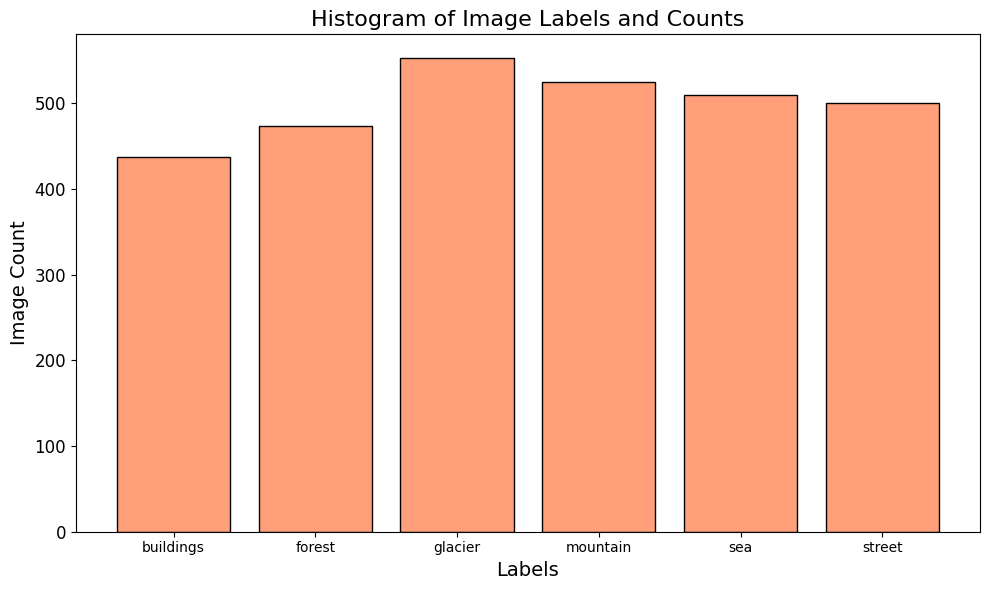

In [ ]:
test_data = {'label': ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street'], 'image_count': [437, 474, 553, 525, 510, 501]}
test_df = pd.DataFrame(test_data)

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(test_df['label'], test_df['image_count'], color='lightsalmon',  edgecolor='black')
plt.title('Histogram of Image Labels and Counts', fontsize=16)
plt.xlabel('Labels', fontsize=14)
plt.ylabel('Image Count', fontsize=14)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

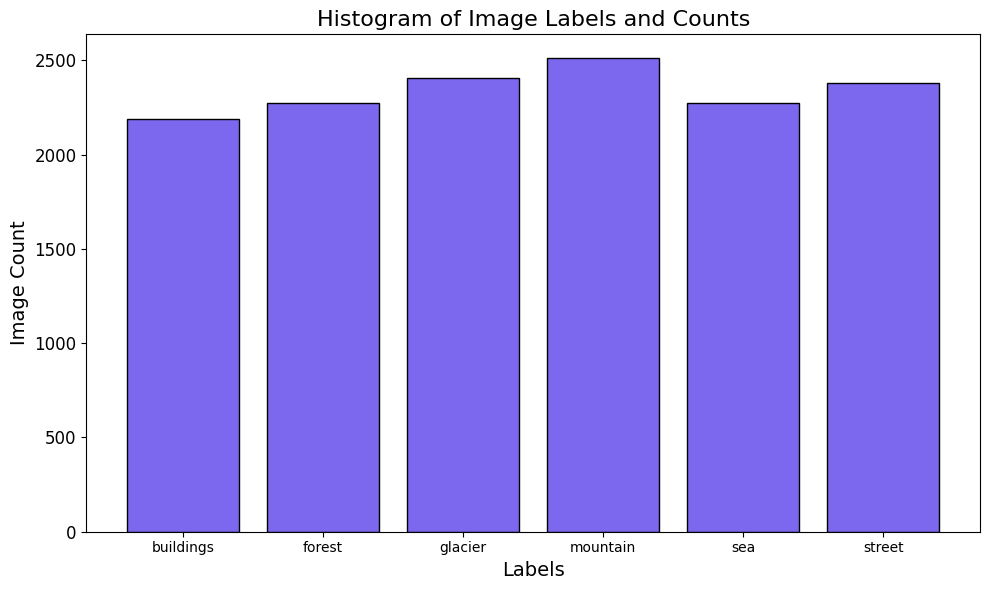

In [ ]:
train_data = {'label': ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street'], 'image_count': [2191, 2271, 2404, 2512, 2274, 2382]}
train_df = pd.DataFrame(train_data)

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(train_df['label'], train_df['image_count'], color='mediumslateblue',  edgecolor='black')
plt.title('Histogram of Image Labels and Counts', fontsize=16)
plt.xlabel('Labels', fontsize=14)
plt.ylabel('Image Count', fontsize=14)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

##### Image Dimensions

In [10]:
size = []

for path in (image_paths):
    
    for folder in os.listdir(path):
        folder_path = os.path.join(path, folder)
        for file in os.listdir(os.path.join(path, folder)):
            image_path = os.path.join(folder_path, file)
            image = plt.imread(image_path)
            size.append(image.shape)

In [11]:
rows = [sublist[0] for sublist in size]
cols = [sublist[1] for sublist in size]
channels = [sublist[2] for sublist in size]

print("Rows Histogram")
print(pd.Series(rows).value_counts())
print("\n Columns Histogram")
print(pd.Series(cols).value_counts())
print("\n Channels Histogram")
print(pd.Series(channels).value_counts())

Rows Histogram
150    17034
Name: count, dtype: int64

 Columns Histogram
150    17034
Name: count, dtype: int64

 Channels Histogram
3    17034
Name: count, dtype: int64


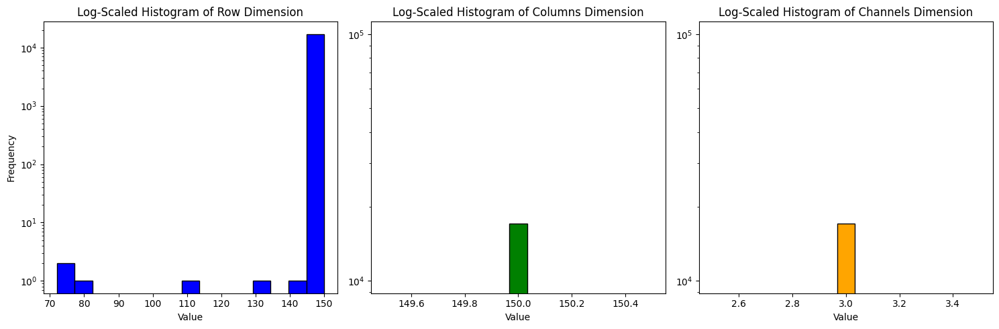

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(15, 5))  # 1 row, 3 columns

# Plot histograms for each dataset
axes[0].hist(rows, bins=15, color='blue', edgecolor='black', log=True)
axes[0].set_title('Log-Scaled Histogram of Row Dimension')
axes[0].set_xlabel('Value')
axes[0].set_ylabel('Frequency')

axes[1].hist(cols, bins=15, color='green', edgecolor='black', log=True)
axes[1].set_title('Log-Scaled Histogram of Columns Dimension')
axes[1].set_xlabel('Value')

axes[2].hist(channels, bins=15, color='orange', edgecolor='black', log=True)
axes[2].set_title('Log-Scaled Histogram of Channels Dimension')
axes[2].set_xlabel('Value')

# Adjust layout for better spacing
plt.tight_layout()

# Show the plots
plt.show()

##### Asses Contrast

seg_test Preview of Images:


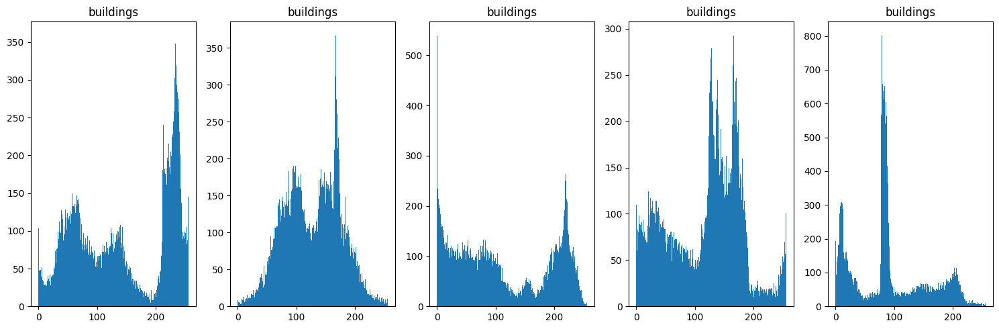

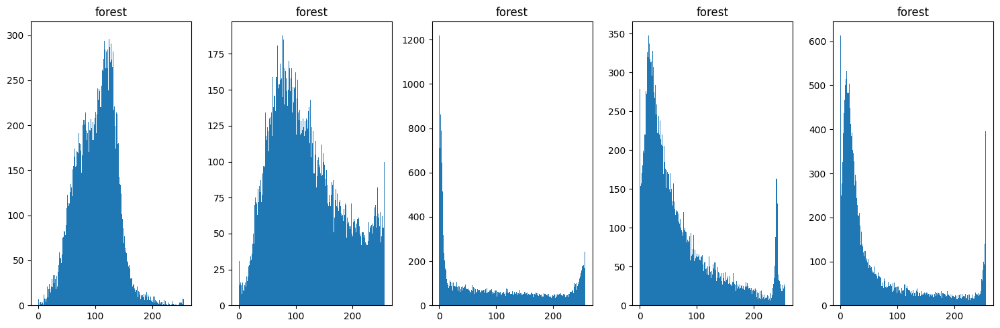

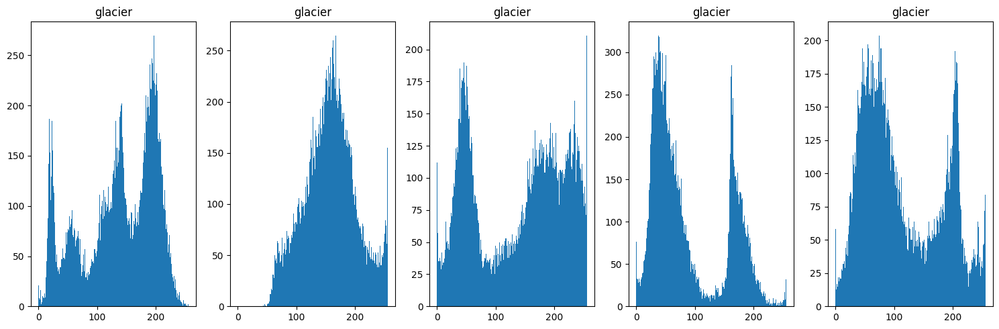

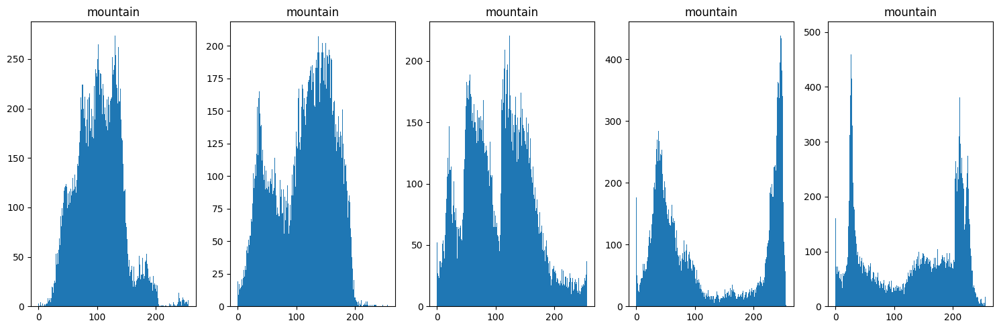

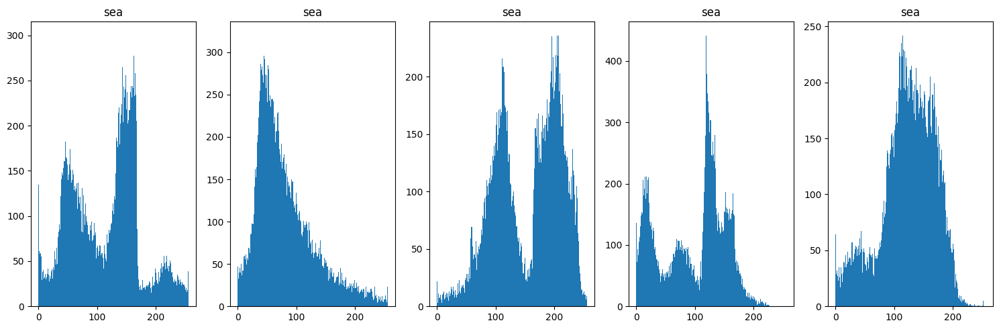

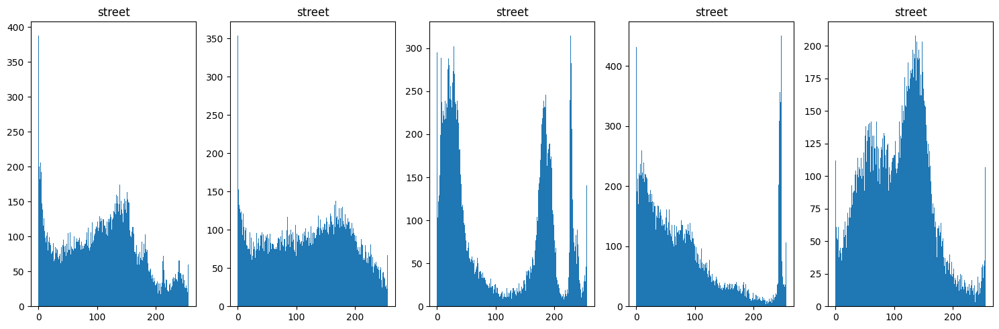

seg_train Preview of Images:


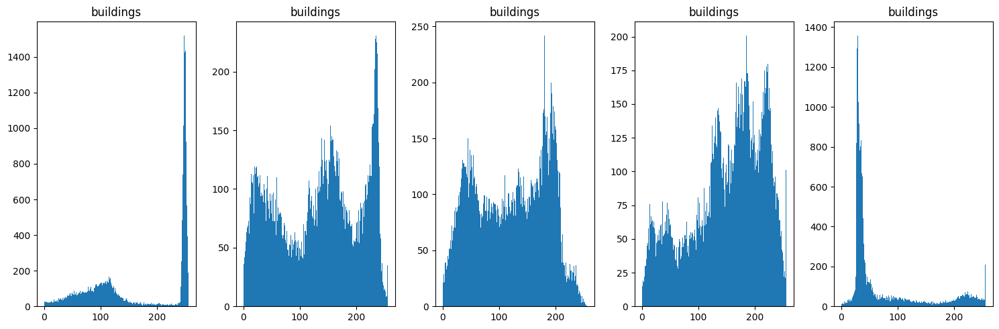

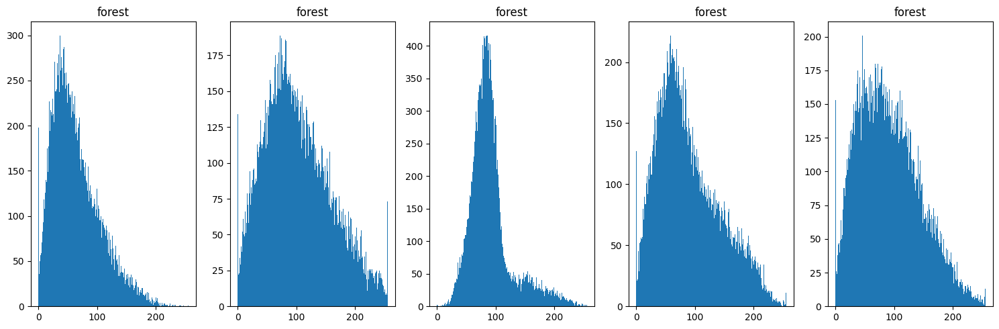

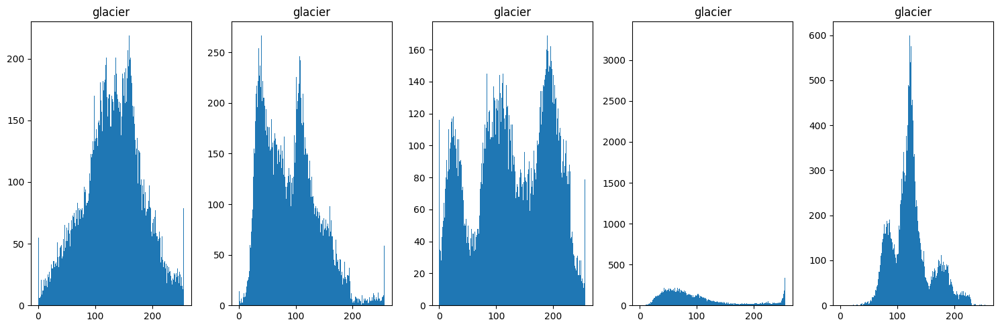

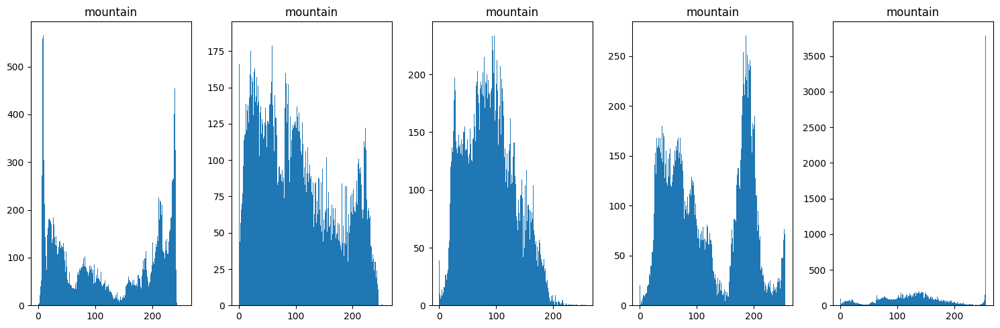

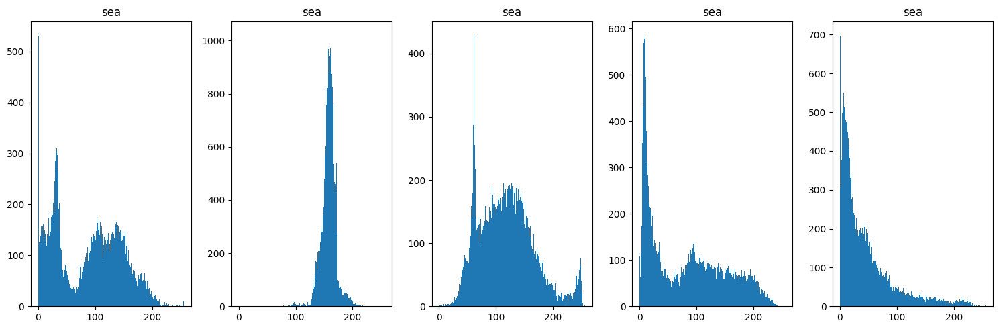

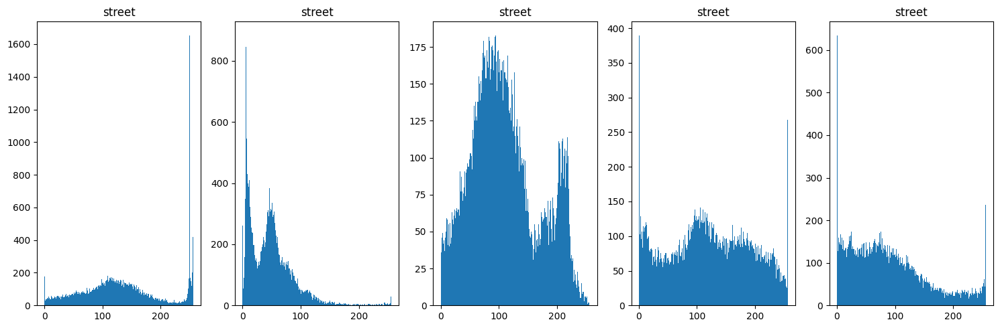

In [ ]:
for path in (image_paths):
    path_name = os.path.basename(path)
    print(f"{path_name} Preview of Images:")
    
    if path == pred_path:
        fig, axes = plt.subplots(6, 5, figsize=(15, 20))
        images = os.listdir(path)[:30]  # Limit to at most 15 images
        
        for index, img_name in enumerate(images):
            i, j = divmod(index, 5)  # Convert index to grid coordinates
            img_path = os.path.join(path, img_name)
            img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)   # Load the image
            
            axes[i, j].set_title(f"Image {index + 1}") 
            axes[i, j].hist(img.ravel(), bins=256, range=[0, 256])
            
        plt.tight_layout()  # Adjust layout to prevent overlap
        plt.show()  # Display the figure

    else:
        for folder in os.listdir(path):
            folder_path = os.path.join(path, folder)
            images = os.listdir(os.path.join(path, folder))
            fig, axes = plt.subplots(1, 5, figsize=(15, 5))
            
            for i, img_name in enumerate(images[:5]):
                img_path = os.path.join(folder_path, img_name)
                img = cv2.imread(img_path, cv2.IMREAD_GRAYSCALE)   # Load the image
                
                axes[i].set_title(f"{folder}") 
                axes[i].hist(img.ravel(), bins=256, range=[0, 256])

            plt.tight_layout()  # Adjust layout
            plt.show()  # Display the figure

##### Asses File Format

In [ ]:
format = []
for path in (image_paths):
      
    if path == pred_path:
        for file in os.listdir(path):
            image_path = os.path.join(path, file)
            image = plt.imread(image_path)
            _, ext = os.path.splitext(file)  # Extract the extension
            format.append(ext)  # Append the format
    
    else:
        for folder in os.listdir(path):
            folder_path = os.path.join(path, folder)
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                _, ext = os.path.splitext(file)  # Extract the extension
                format.append(ext)  # Append the format


In [ ]:
print(pd.Series(format).value_counts())

.jpg    17034
Name: count, dtype: int64


### Clean Data

##### Rows & Resize Columns

In [ ]:
format = []
for path in (image_paths):
      
    if path == pred_path:
        for file in os.listdir(path):
            image_path = os.path.join(path, file)
            image = Image.open(image_path)
            resized_img = image.resize((150, 150))
            resized_img.save(image_path)
    
    else:
        for folder in os.listdir(path):
            folder_path = os.path.join(path, folder)
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                image = Image.open(image_path)
                resized_img = image.resize((150, 150))
                resized_img.save(image_path)

##### Confirm Resizing

In [ ]:
size = []

for path in (image_paths):
      
    if path == pred_path:
        for file in os.listdir(path):
            image_path = os.path.join(path, file)
            image = plt.imread(image_path)
            size.append(image.shape)
    
    else:
        for folder in os.listdir(path):
            folder_path = os.path.join(path, folder)
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                image = plt.imread(image_path)
                size.append(image.shape)

In [ ]:
pd.Series(size).value_counts()

(150, 150, 3)    17034
Name: count, dtype: int64

##### Pixel Normalization

In [ ]:
# size = []

# for path in (image_paths):
      
#     if path == pred_path:
#         for file in os.listdir(path):
#             image_path = os.path.join(path, file)
#             image = plt.imread(image_path)
#             X_train = image.astype('float32') / 255.0

    
#     else:
#         for folder in os.listdir(path):
#             folder_path = os.path.join(path, folder)
#             for file in os.listdir(os.path.join(path, folder)):
#                 image_path = os.path.join(folder_path, file)
#                 image = plt.imread(image_path)
#                 size.append(image.shape)

### Image EDA

##### First 30 Images of Each Dataset

seg_test Preview of Images:


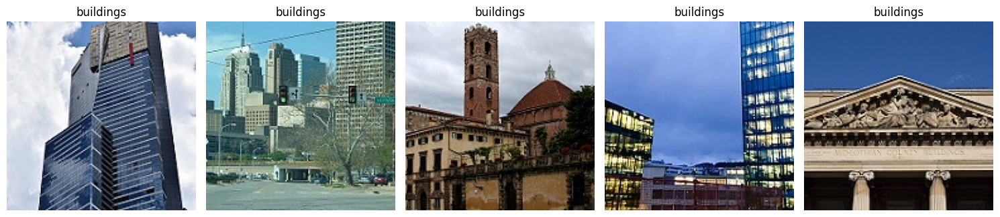

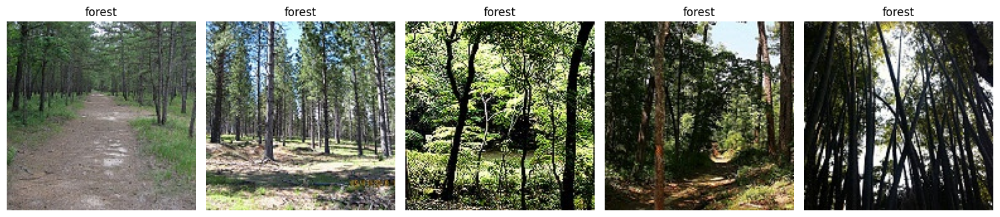

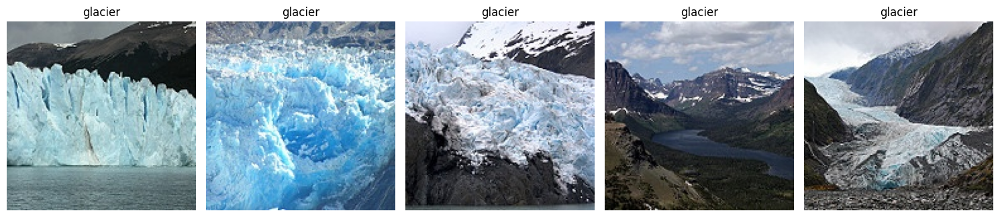

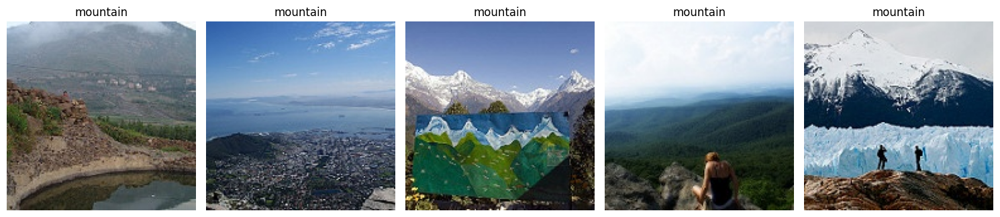

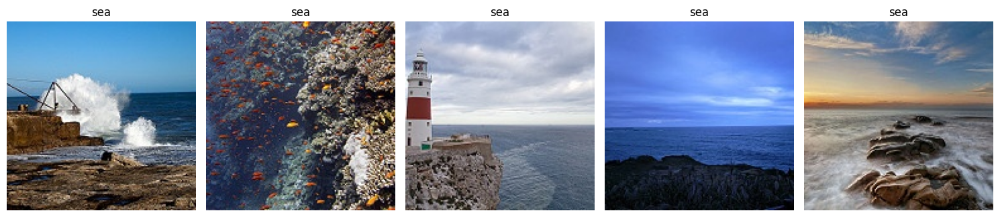

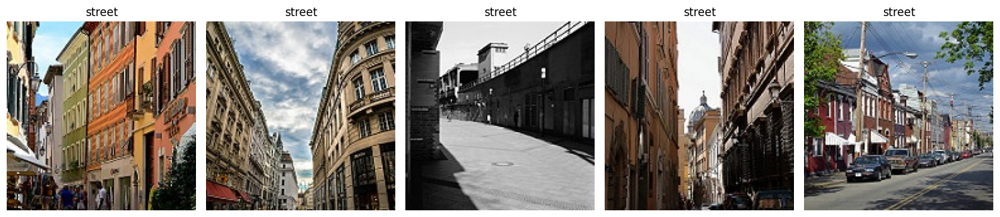

seg_train Preview of Images:


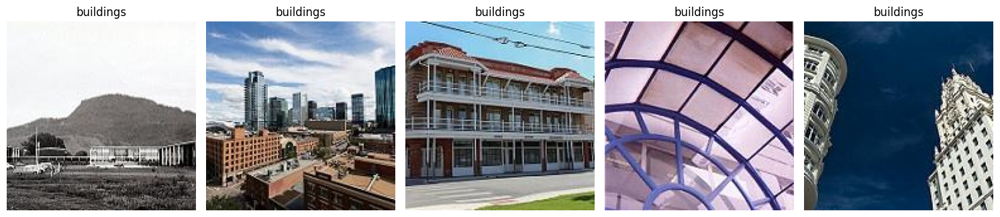

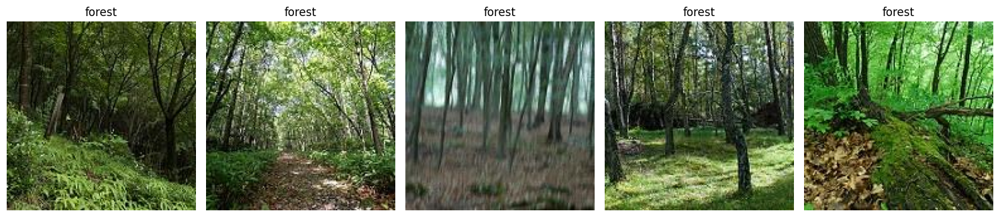

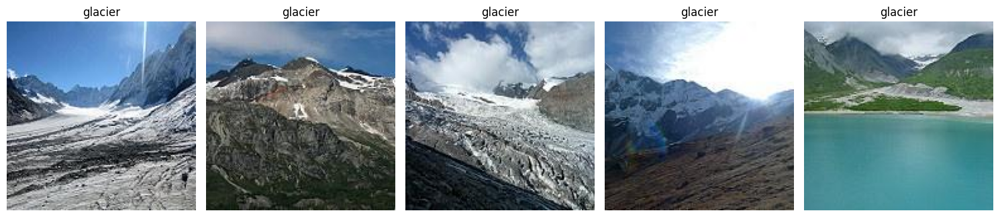

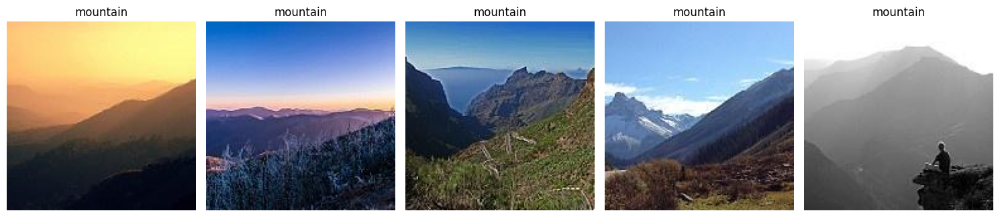

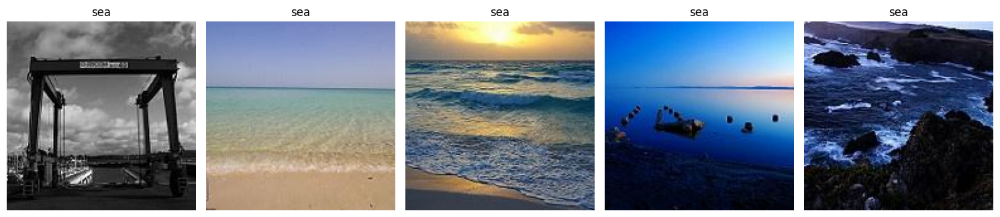

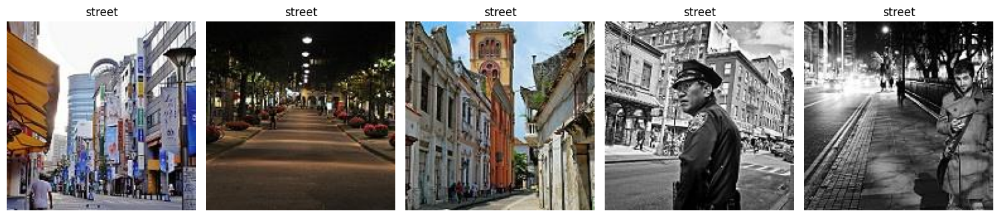

In [ ]:
for path in (image_paths):
    path_name = os.path.basename(path)
    print(f"{path_name} Preview of Images:")
    
    if path == pred_path:
        fig, axes = plt.subplots(6, 5, figsize=(15, 20))
        images = os.listdir(path)[:30]  # Limit to at most 15 images
        
        for index, img_name in enumerate(images):
            i, j = divmod(index, 5)  # Convert index to grid coordinates
            img_path = os.path.join(path, img_name)
            img = Image.open(img_path)  # Load the image
            
            axes[i, j].imshow(img)
            axes[i, j].axis('off')  # Turn off axis labels
            axes[i, j].set_title(f"Image {index + 1}")  # Optional: Add titles

        plt.tight_layout()  # Adjust layout to prevent overlap
        plt.show()  # Display the figure

    else:
        for folder in os.listdir(path):
            folder_path = os.path.join(path, folder)
            images = os.listdir(os.path.join(path, folder))
            fig, axes = plt.subplots(1, 5, figsize=(15, 5))
            
            for i, img_name in enumerate(images[:5]):
                img_path = os.path.join(folder_path, img_name)
                img = Image.open(img_path)  # Load the image
                
                axes[i].imshow(img)
                axes[i].axis('off')  # Turn off axis labels
                axes[i].set_title(f"{folder}")  # Optional: Add titles

            plt.tight_layout()  # Adjust layout
            plt.show()  # Display the figure
                


##### HSV Color Histogram Sample

seg_test Preview of Images:


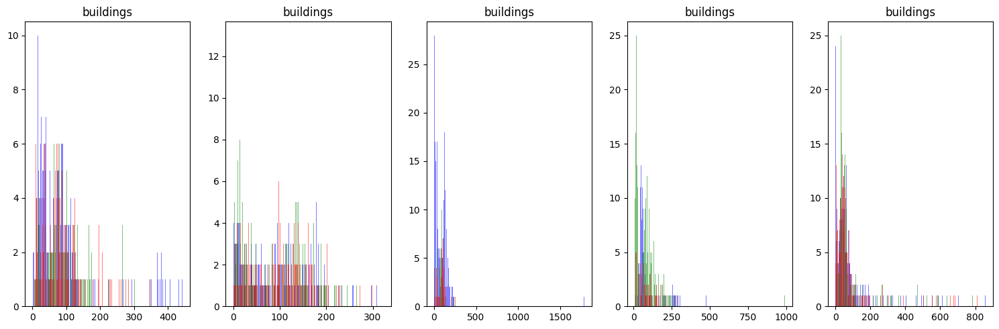

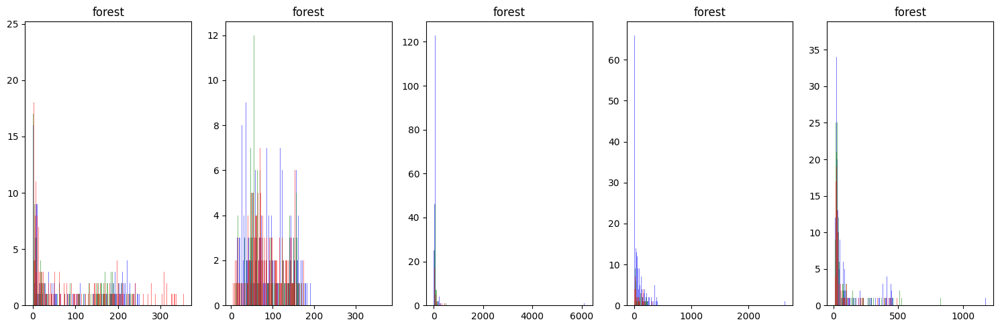

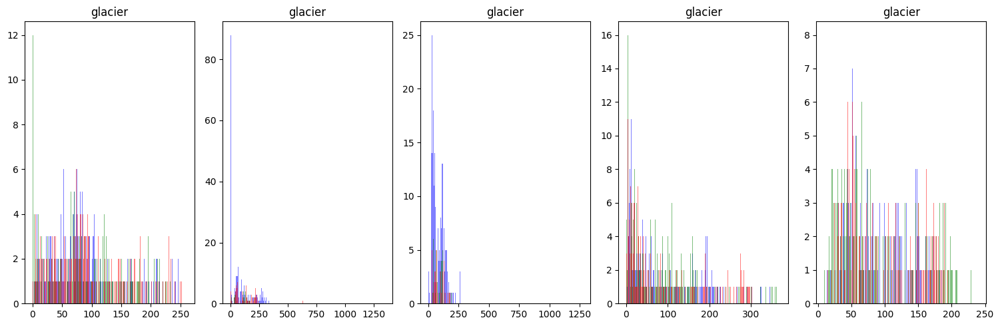

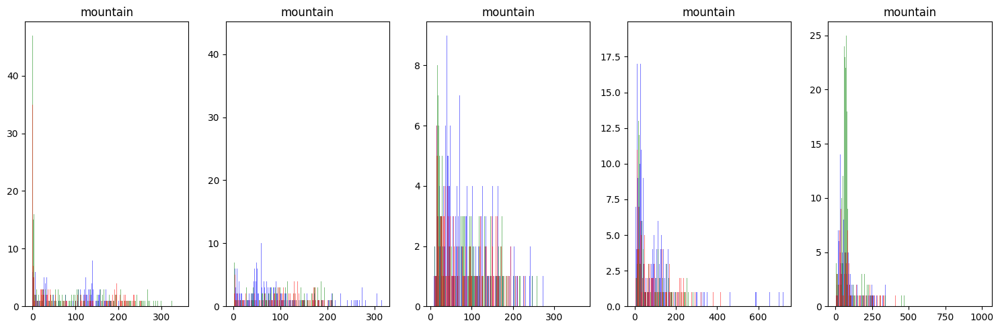

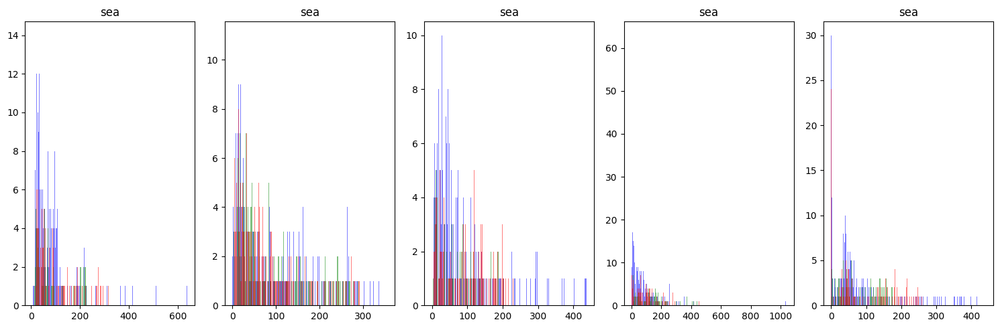

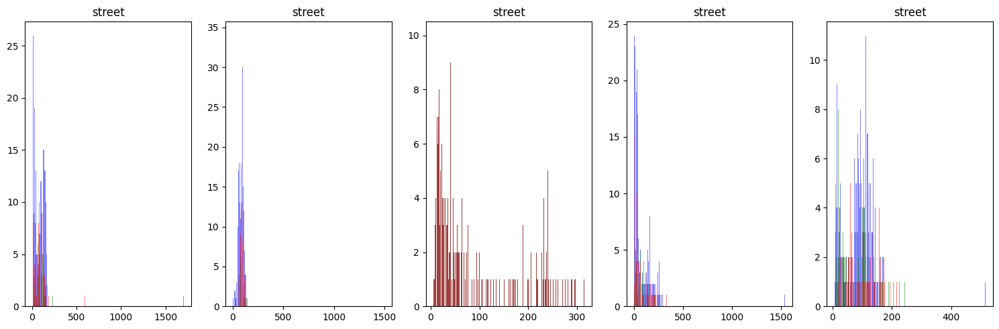

seg_train Preview of Images:


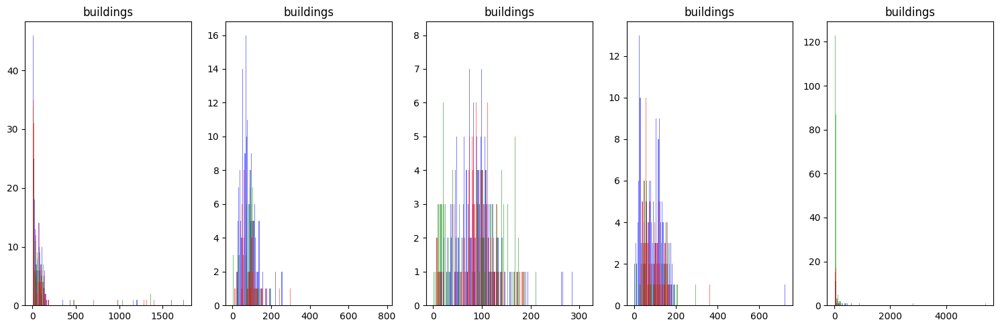

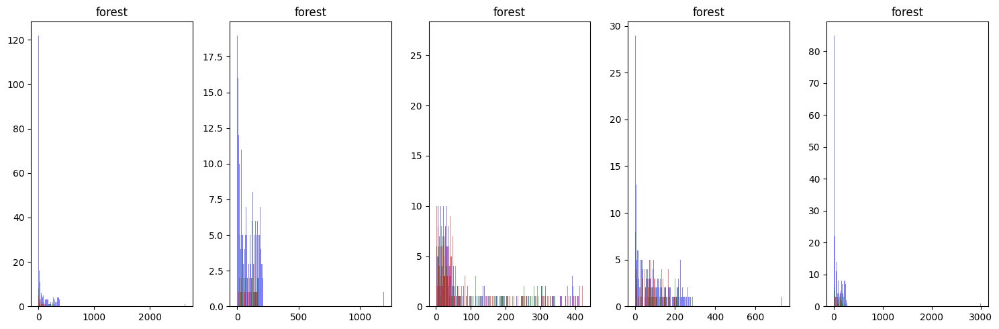

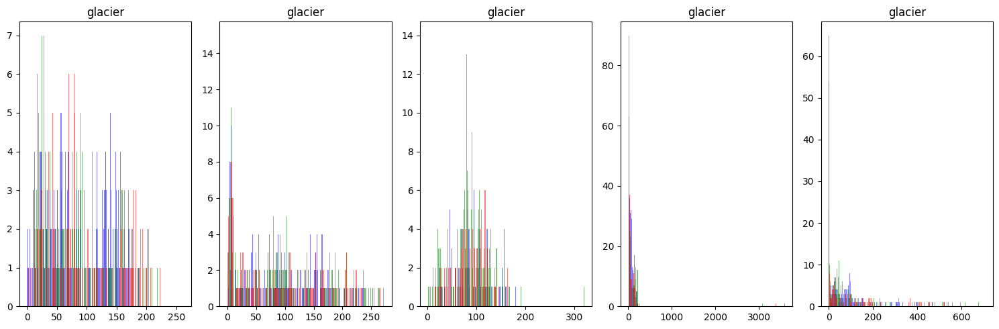

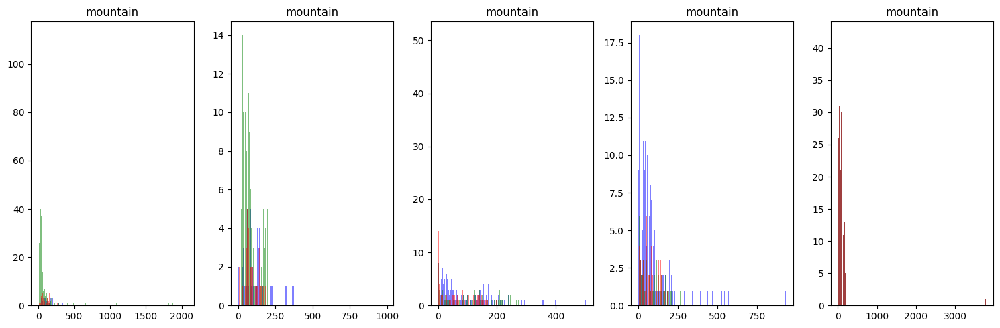

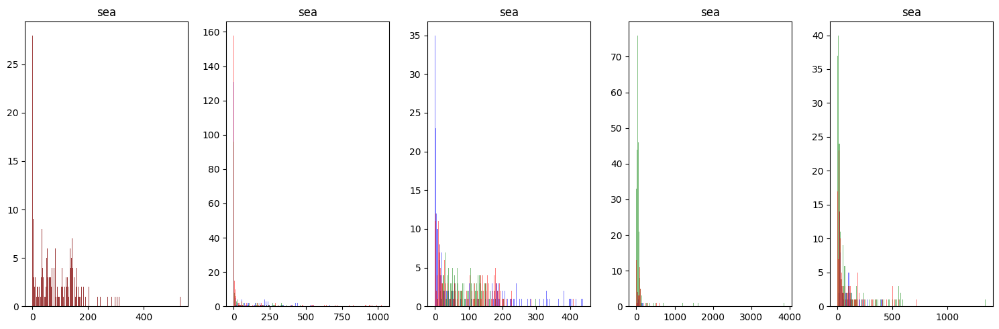

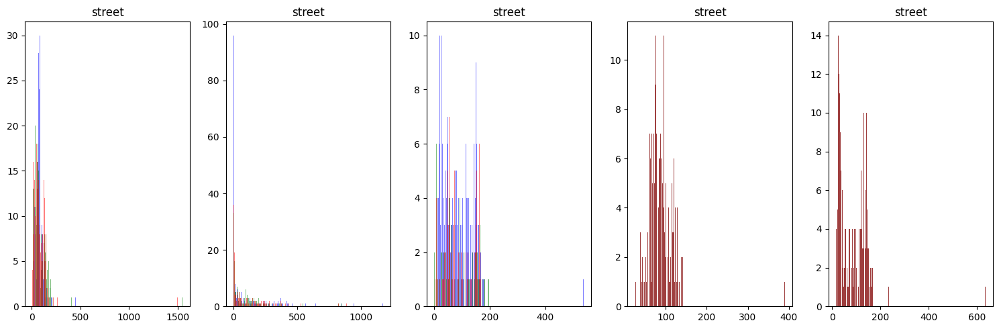

In [ ]:
for path in (image_paths):
    path_name = os.path.basename(path)
    print(f"{path_name} Preview of Images:")
    
    if path == pred_path:
        fig, axes = plt.subplots(6, 5, figsize=(15, 20))
        images = os.listdir(path)[:30]  # Limit to at most 15 images
        
        for index, img_name in enumerate(images):
            i, j = divmod(index, 5)  # Convert index to grid coordinates
            img_path = os.path.join(path, img_name)
            img = cv2.imread(img_path)   # Load the image
            
            blue_color = cv2.calcHist([img], [0], None, [256], [0, 256]) 
            red_color = cv2.calcHist([img], [1], None, [256], [0, 256]) 
            green_color = cv2.calcHist([img], [2], None, [256], [0, 256])
            
            # combined histogram 
            axes[i, j].set_title(f"Image {index + 1}") 
            axes[i, j].hist(blue_color, bins=256, color='blue', alpha=0.5, label='Blue', rwidth=0.85) 
            axes[i, j].hist(green_color, bins=256, color='green', alpha=0.5, label='Green', rwidth=0.85) 
            axes[i, j].hist(red_color, bins=256, color='red', alpha=0.5, label='Red', rwidth=0.85) 
            
        plt.tight_layout()  # Adjust layout to prevent overlap
        plt.show()  # Display the figure

    else:
        for folder in os.listdir(path):
            folder_path = os.path.join(path, folder)
            images = os.listdir(os.path.join(path, folder))
            fig, axes = plt.subplots(1, 5, figsize=(15, 5))
            
            for i, img_name in enumerate(images[:5]):
                img_path = os.path.join(folder_path, img_name)
                img = cv2.imread(img_path)   # Load the image
                
                blue_color = cv2.calcHist([img], [0], None, [256], [0, 256]) 
                red_color = cv2.calcHist([img], [1], None, [256], [0, 256]) 
                green_color = cv2.calcHist([img], [2], None, [256], [0, 256])
                
                # combined histogram 
                axes[i].set_title(f"{folder}") 
                axes[i].hist(blue_color, bins=256, color='blue', alpha=0.5, label='Blue', rwidth=0.85) 
                axes[i].hist(green_color, bins=256, color='green', alpha=0.5, label='Green', rwidth=0.85) 
                axes[i].hist(red_color, bins=256, color='red', alpha=0.5, label='Red', rwidth=0.85) 

            plt.tight_layout()  # Adjust layout
            plt.show()  # Display the figure

##### HSV Image Storage

In [ ]:
train_images_hsv = []
test_images_hsv = []


for path in (image_paths):
    path_name = os.path.basename(path)

    for folder in os.listdir(path):
        folder_path = os.path.join(path, folder)
        if path == train_path:
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                img = cv2.imread(image_path)  # Load the image
                
                # Compute histograms
                blue_hist = cv2.calcHist([img], [0], None, [256], [0, 256]).flatten()
                green_hist = cv2.calcHist([img], [1], None, [256], [0, 256]).flatten()
                red_hist = cv2.calcHist([img], [2], None, [256], [0, 256]).flatten()
                
                # Combine histograms into a feature vector
                feature_vector = np.concatenate([blue_hist, green_hist, red_hist])
                
                # Normalize the feature vector
                feature_vector /= np.sum(feature_vector)
                
                # Append features and labels to respective lists
                train_images_hsv.append(feature_vector)
        
        elif path == test_path:
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                img = cv2.imread(image_path)  # Load the image
                
                # Compute histograms
                blue_hist = cv2.calcHist([img], [0], None, [256], [0, 256]).flatten()
                green_hist = cv2.calcHist([img], [1], None, [256], [0, 256]).flatten()
                red_hist = cv2.calcHist([img], [2], None, [256], [0, 256]).flatten()
                
                # Combine histograms into a feature vector
                feature_vector = np.concatenate([blue_hist, green_hist, red_hist])
                
                # Normalize the feature vector
                feature_vector /= np.sum(feature_vector)
                
                # Append features and labels to respective lists
                test_images_hsv.append(feature_vector)
                
# Convert lists to numpy arrays for ML processing
train_images_hsv = np.array(train_images_hsv)
test_images_hsv = np.array(test_images_hsv)

### HOG

seg_test Preview of Images:


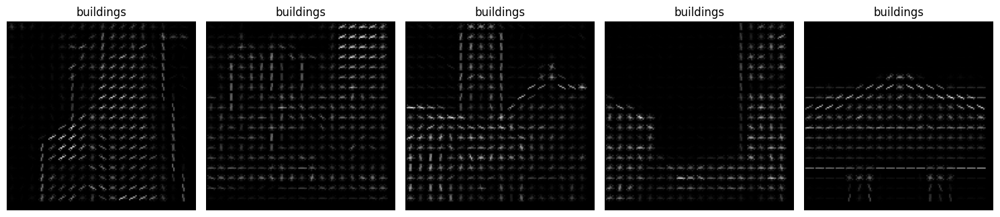

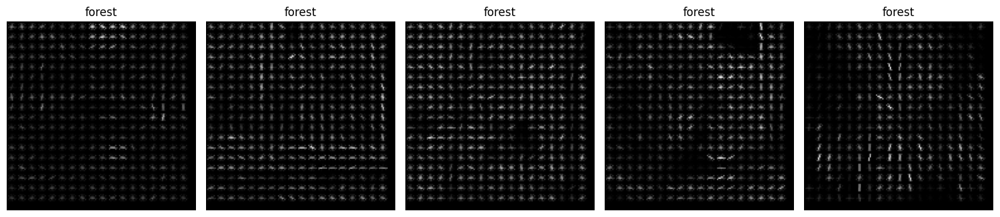

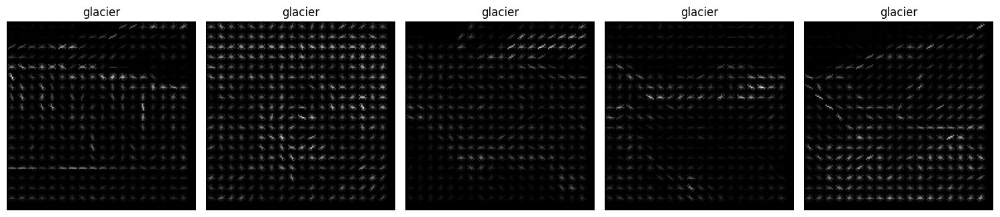

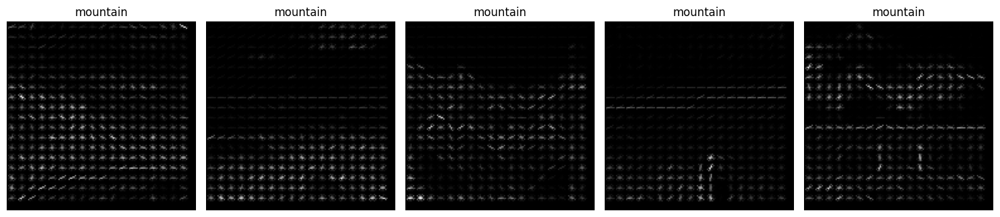

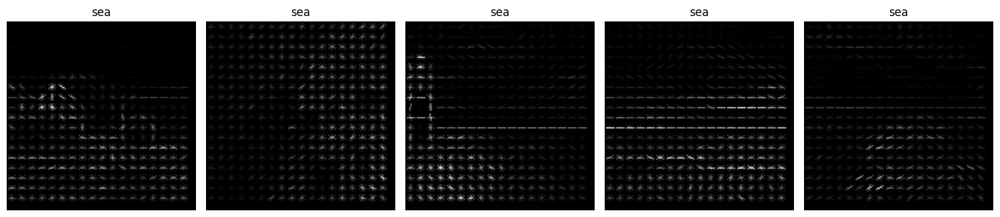

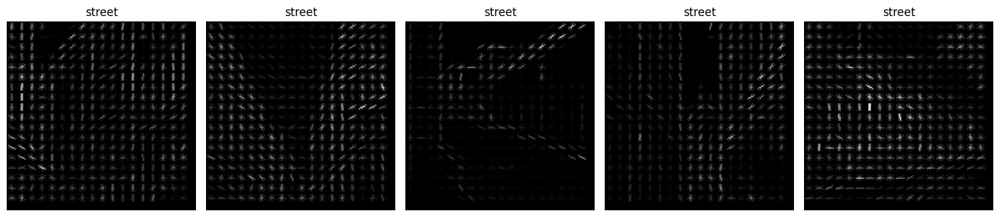

seg_train Preview of Images:


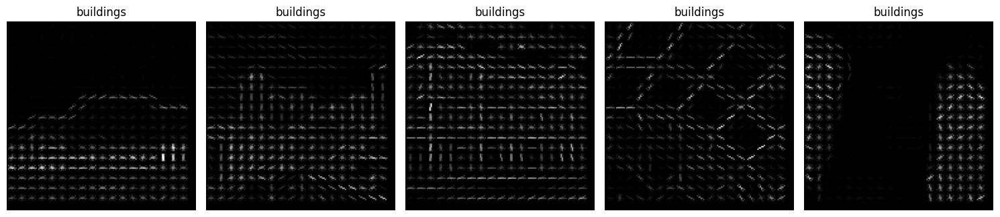

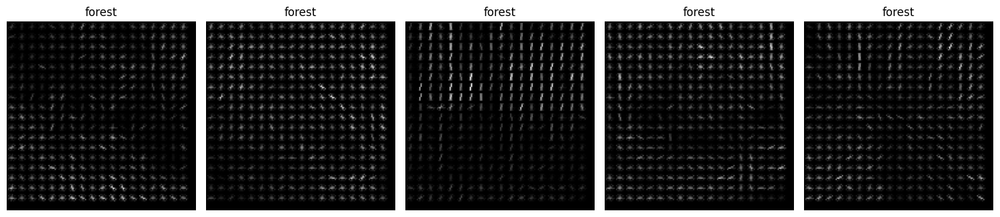

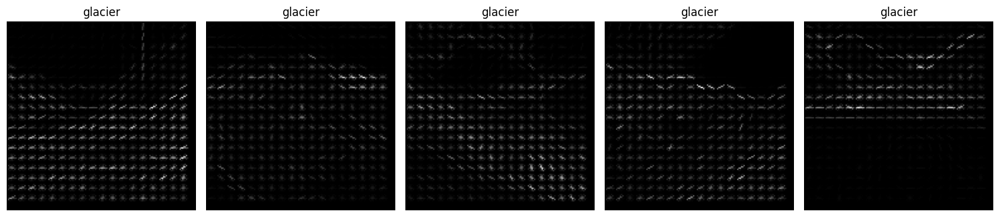

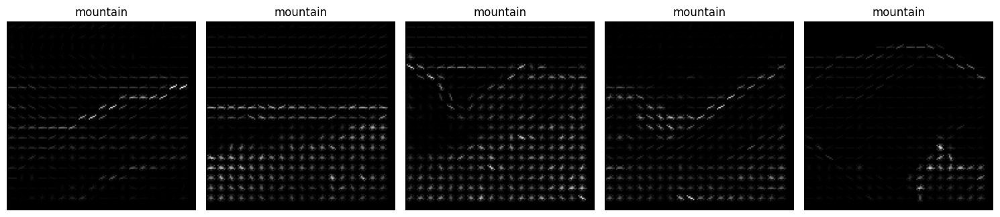

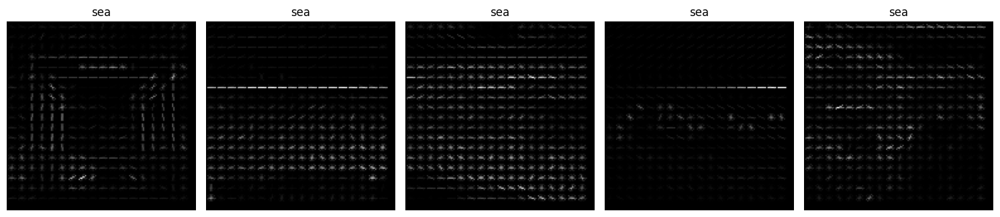

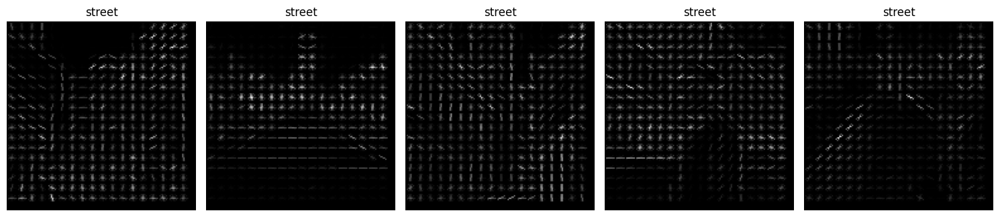

In [ ]:
for path in (image_paths):
    path_name = os.path.basename(path)
    print(f"{path_name} Preview of Images:")
    
    if path == pred_path:
        fig, axes = plt.subplots(6, 5, figsize=(15, 20))
        images = os.listdir(path)[:30]  # Limit to at most 15 images
        
        for index, img_name in enumerate(images):
            i, j = divmod(index, 5)  # Convert index to grid coordinates
            img_path = os.path.join(path, img_name)
            img = Image.open(img_path)  # Load the image
            img = color.rgb2gray(np.array(img))
            
            # Calculate HOG features and the visualization image
            hog_features, hog_image = hog(
                img,
                pixels_per_cell=(8, 8),      # Size of cell in pixels
                cells_per_block=(2, 2),      # Number of cells in each block
                block_norm='L2-Hys',         # Block normalization method
                visualize=True,              # Output HOG image as well
                feature_vector=True          # Return as a flat feature vector
            )
            
            axes[i, j].imshow(hog_image, cmap = 'gray')
            axes[i, j].axis('off')  # Turn off axis labels
            axes[i, j].set_title(f"Image {index + 1}")  # Optional: Add titles

        plt.tight_layout()  # Adjust layout to prevent overlap
        plt.show()  # Display the figure

    else:
        for folder in os.listdir(path):
            folder_path = os.path.join(path, folder)
            images = os.listdir(os.path.join(path, folder))
            fig, axes = plt.subplots(1, 5, figsize=(15, 5))
            
            for i, img_name in enumerate(images[:5]):
                img_path = os.path.join(folder_path, img_name)
                img = Image.open(img_path)  # Load the image
                img = color.rgb2gray(np.array(img))
            
                # Calculate HOG features and the visualization image
                hog_features, hog_image = hog(
                    img,
                    pixels_per_cell=(8, 8),      # Size of cell in pixels
                    cells_per_block=(2, 2),      # Number of cells in each block
                    block_norm='L2-Hys',         # Block normalization method
                    visualize=True,              # Output HOG image as well
                    feature_vector=True          # Return as a flat feature vector
                )
                
                axes[i].imshow(hog_image, cmap = 'gray')
                axes[i].axis('off')  # Turn off axis labels
                axes[i].set_title(f"{folder}")  # Optional: Add titles

            plt.tight_layout()  # Adjust layout
            plt.show()  # Display the figure
                


##### Store HOG Images

In [ ]:
# takes 80 mins to run
train_images_hog = []
test_images_hog = []


for path in (image_paths):

    for folder in os.listdir(path):
        folder_path = os.path.join(path, folder)
        if path == train_path:
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                img = Image.open(image_path)  # Load the image
                img = color.rgb2gray(np.array(img))
                
                # Calculate HOG features and the visualization image
                hog_features, hog_image = hog(
                    img,
                    pixels_per_cell=(8, 8),      # Size of cell in pixels
                    cells_per_block=(2, 2),      # Number of cells in each block
                    block_norm='L2-Hys',         # Block normalization method
                    visualize=True,              # Output HOG image as well
                    feature_vector=True          # Return as a flat feature vector
                )
                
                train_images_hog.append(hog_features)
        
        elif path == test_path:
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                img = Image.open(image_path)  # Load the image
                img = color.rgb2gray(np.array(img))
                
                # Calculate HOG features and the visualization image
                hog_features, hog_image = hog(
                    img,
                    pixels_per_cell=(8, 8),      # Size of cell in pixels
                    cells_per_block=(2, 2),      # Number of cells in each block
                    block_norm='L2-Hys',         # Block normalization method
                    visualize=True,              # Output HOG image as well
                    feature_vector=True          # Return as a flat feature vector
                )
                
                test_images_hog.append(hog_features)
                
# Convert lists to numpy arrays for ML processing
train_images_hog = np.array(train_images_hog)
test_images_hog = np.array(test_images_hog)

##### PCA

In [6]:
from sklearn.decomposition import PCA
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from sklearn.preprocessing import StandardScaler

In [7]:
train_pca_images = []
test_pca_images = []
train_pca_labels = []
test_pca_labels = []

for path in (image_paths):
    path_name = os.path.basename(path)

    for folder in os.listdir(path):
        folder_path = os.path.join(path, folder)
        if path == train_path:
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                img = load_img(image_path, target_size=(150, 150))  # Load image
                img_array = img_to_array(img)                  # Convert to array
                train_pca_images.append(img_array.flatten())   # Flatten the image
                train_pca_labels.append(folder)
                
        
        elif path == test_path:
            for file in os.listdir(os.path.join(path, folder)):
                image_path = os.path.join(folder_path, file)
                img = load_img(image_path, target_size=(150, 150))  # Load image
                img_array = img_to_array(img)                  # Convert to array
                test_pca_images.append(img_array.flatten())   # Flatten the image
                test_pca_labels.append(folder)

In [8]:
# transform labels to int
labels = {'buildings': 0, 'forest': 1, 'glacier': 2, 'mountain': 3, 'sea': 4, 'street': 5}
train_pca_labels_int = [labels[label] for label in train_pca_labels]
test_pca_labels_int = [labels[label] for label in test_pca_labels]

In [9]:
# Convert to numpy arrays
train_pca_images = np.array(train_pca_images)
test_pca_images = np.array(test_pca_images)
train_pca_labels_int = np.array(train_pca_labels_int)
test_pca_labels_int = np.array(test_pca_labels_int)

In [10]:
# Normalize the data
scaler = StandardScaler()
train_data_normalized = scaler.fit_transform(train_pca_images)
test_data_normalized = scaler.fit_transform(test_pca_images)

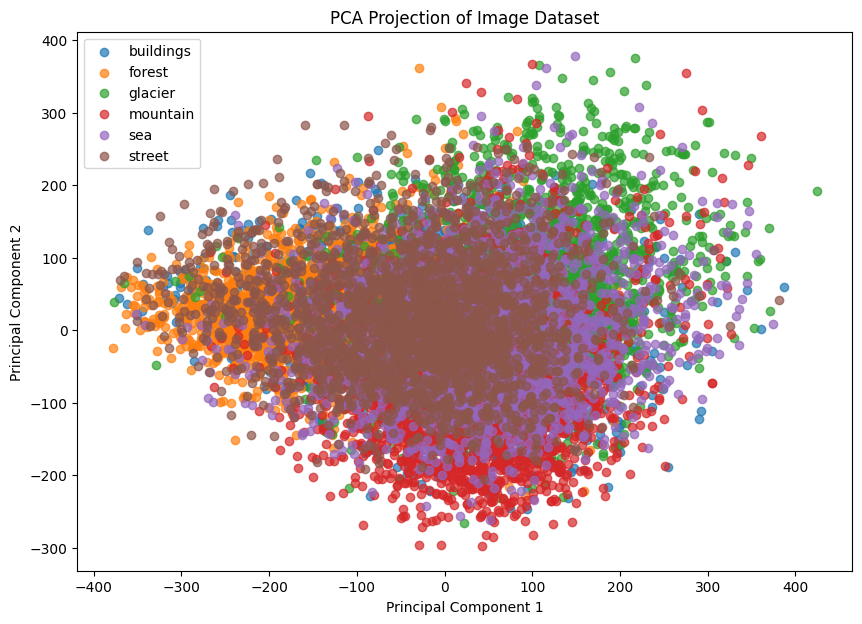

In [18]:
# Apply PCA - Train
categories = ["buildings", "forest", "glacier", "mountain", "sea", "street"]

n_components = 2  # Reduce to 2 dimensions
pca = PCA(n_components=n_components)
train_pca = pca.fit_transform(train_data_normalized)

# Visualize the result
plt.figure(figsize=(10, 7))
for label, category in enumerate(categories):
    idx = train_pca_labels_int == label
    plt.scatter(train_pca[idx, 0], train_pca[idx, 1], label=category, alpha=0.7)
plt.title("PCA Projection of Image Dataset")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.show()

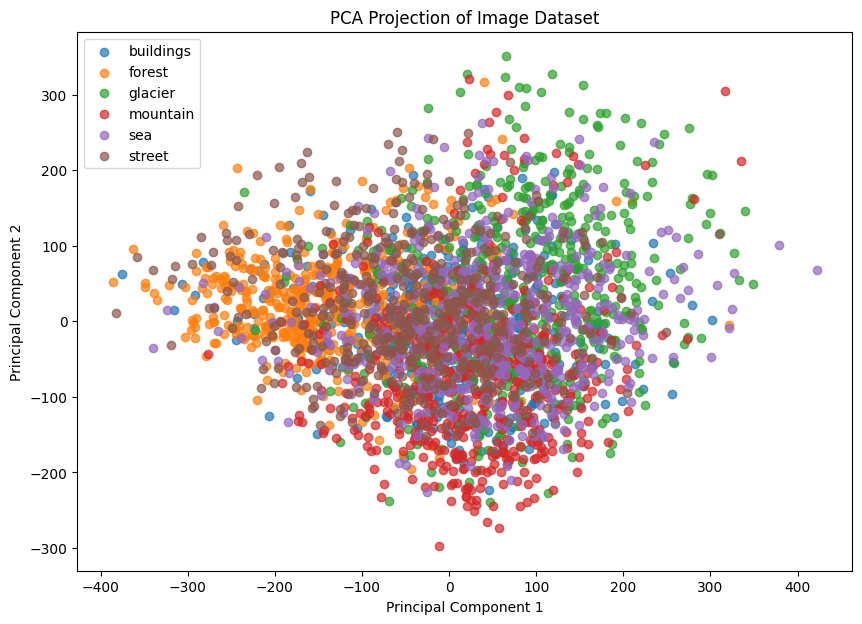

In [17]:
# Apply PCA - Train
categories = ["buildings", "forest", "glacier", "mountain", "sea", "street"]

n_components = 2  # Reduce to 2 dimensions
pca = PCA(n_components=n_components)
test_pca = pca.fit_transform(test_data_normalized)

# Visualize the result
plt.figure(figsize=(10, 7))
for label, category in enumerate(categories):
    idx = test_pca_labels_int == label
    plt.scatter(test_pca[idx, 0], test_pca[idx, 1], label=category, alpha=0.7)
plt.title("PCA Projection of Image Dataset")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend()
plt.show()

##### tSNE

In [47]:
from sklearn.manifold import TSNE

In [50]:
# Using pca preprocessing from above
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
train_data_tsne = tsne.fit_transform(train_data_normalized)

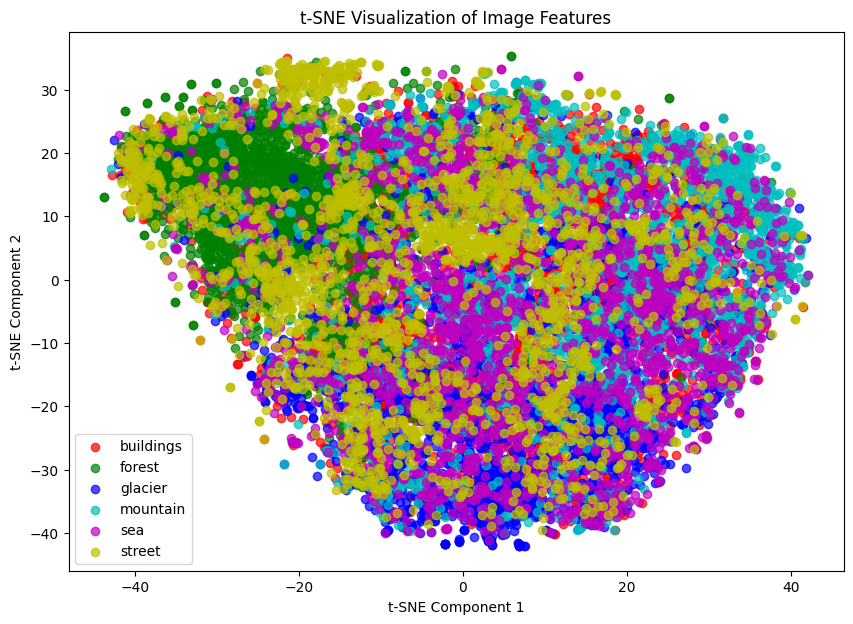

In [51]:
# Visualize the t-SNE projection
plt.figure(figsize=(10, 7))
categories = ["buildings", "forest", "glacier", "mountain", "sea", "street"]
colors = ['r', 'g', 'b', 'c', 'm', 'y']

for label, color, category in zip(range(len(categories)), colors, categories):
    idx = train_pca_labels_int == label
    plt.scatter(train_data_tsne[idx, 0], train_data_tsne[idx, 1], label=category, c=color, alpha=0.7)

plt.title("t-SNE Visualization of Image Features")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend()
plt.show()

In [53]:
# Using pca preprocessing from above
tsne = TSNE(n_components=2, random_state=42, perplexity=30, n_iter=1000)
test_data_tsne = tsne.fit_transform(test_data_normalized)

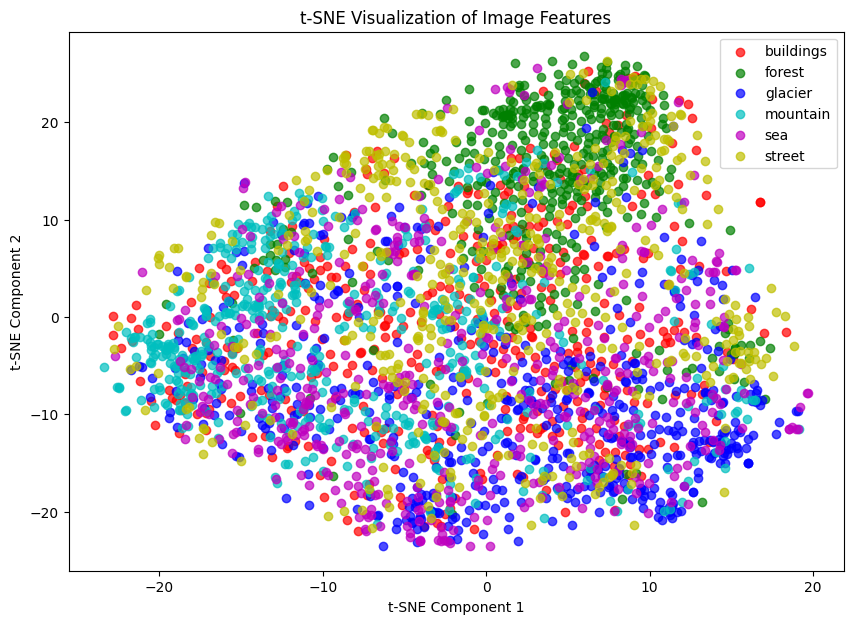

In [54]:
# Visualize the t-SNE projection
plt.figure(figsize=(10, 7))
categories = ["buildings", "forest", "glacier", "mountain", "sea", "street"]
colors = ['r', 'g', 'b', 'c', 'm', 'y']

for label, color, category in zip(range(len(categories)), colors, categories):
    idx = test_pca_labels_int == label
    plt.scatter(test_data_tsne[idx, 0], test_data_tsne[idx, 1], label=category, c=color, alpha=0.7)

plt.title("t-SNE Visualization of Image Features")
plt.xlabel("t-SNE Component 1")
plt.ylabel("t-SNE Component 2")
plt.legend()
plt.show()